In [ ]:
import pandas as pd
import numpy as np
import h5py
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import os
os.chdir(r'/content/gdrive/MyDrive/Land Slide/dataset')

# dataset preprocessing

In [ ]:
# Testing the dataset
path_single = r"TrainData/img/image_2000.h5"
path_single_mask = r'TrainData/mask/mask_2000.h5'

In [ ]:
TRAIN_PATH = r"TrainData/img/*.h5"
TRAIN_MASK = r'TrainData/mask/*.h5'

TRAIN_XX = np.zeros((3799, 128, 128, 6))
TRAIN_YY = np.zeros((3799, 128, 128, 1))
all_train = sorted(glob.glob(TRAIN_PATH))
all_mask = sorted(glob.glob(TRAIN_MASK))

## dataset preparation


In [ ]:
for i, (img, mask) in enumerate(zip(all_train, all_mask)):
    print(i, img, mask)
    with h5py.File(img) as hdf:
        ls = list(hdf.keys())
        data = np.array(hdf.get('img'))

        # assign 0 for the nan value
        data[np.isnan(data)] = 0.000001

        # to normalize the data
        mid_rgb = data[:, :, 1:4].max() / 2.0
        mid_slope = data[:, :, 12].max() / 2.0
        mid_elevation = data[:, :, 13].max() / 2.0

        # ndvi calculation
        data_red = data[:, :, 3]
        data_nir = data[:, :, 7]
        data_ndvi = np.divide(data_nir - data_red,np.add(data_nir, data_red))

        # final array
        TRAIN_XX[i, :, :, 0] = 1 - data[:, :, 3] / mid_rgb  #RED
        TRAIN_XX[i, :, :, 1] = 1 - data[:, :, 2] / mid_rgb #GREEN
        TRAIN_XX[i, :, :, 2] = 1 - data[:, :, 1] / mid_rgb #BLUE
        TRAIN_XX[i, :, :, 3] = data_ndvi #NDVI
        TRAIN_XX[i, :, :, 4] = 1 - data[:, :, 12] / mid_slope #SLOPE
        TRAIN_XX[i, :, :, 5] = 1 - data[:, :, 13] / mid_elevation #ELEVATION


    with h5py.File(mask) as hdf:
        ls = list(hdf.keys())
        data=np.array(hdf.get('mask'))
        TRAIN_YY[i, :, :, 0] = data


0 TrainData/img/image_1.h5 TrainData/mask/mask_1.h5
1 TrainData/img/image_10.h5 TrainData/mask/mask_10.h5
2 TrainData/img/image_100.h5 TrainData/mask/mask_100.h5
3 TrainData/img/image_1000.h5 TrainData/mask/mask_1000.h5
4 TrainData/img/image_1001.h5 TrainData/mask/mask_1001.h5
5 TrainData/img/image_1002.h5 TrainData/mask/mask_1002.h5
6 TrainData/img/image_1003.h5 TrainData/mask/mask_1003.h5
7 TrainData/img/image_1004.h5 TrainData/mask/mask_1004.h5
8 TrainData/img/image_1005.h5 TrainData/mask/mask_1005.h5
9 TrainData/img/image_1006.h5 TrainData/mask/mask_1006.h5
10 TrainData/img/image_1007.h5 TrainData/mask/mask_1007.h5
11 TrainData/img/image_1008.h5 TrainData/mask/mask_1008.h5
12 TrainData/img/image_1009.h5 TrainData/mask/mask_1009.h5
13 TrainData/img/image_101.h5 TrainData/mask/mask_101.h5
14 TrainData/img/image_1010.h5 TrainData/mask/mask_1010.h5
15 TrainData/img/image_1011.h5 TrainData/mask/mask_1011.h5
16 TrainData/img/image_1012.h5 TrainData/mask/mask_1012.h5
17 TrainData/img/imag

<ipython-input-6-fefaee75c89a>:25: RuntimeWarning: invalid value encountered in divide
  TRAIN_XX[i, :, :, 4] = 1 - data[:, :, 12] / mid_slope #SLOPE


1671 TrainData/img/image_2502.h5 TrainData/mask/mask_2502.h5
1672 TrainData/img/image_2503.h5 TrainData/mask/mask_2503.h5
1673 TrainData/img/image_2504.h5 TrainData/mask/mask_2504.h5
1674 TrainData/img/image_2505.h5 TrainData/mask/mask_2505.h5
1675 TrainData/img/image_2506.h5 TrainData/mask/mask_2506.h5
1676 TrainData/img/image_2507.h5 TrainData/mask/mask_2507.h5
1677 TrainData/img/image_2508.h5 TrainData/mask/mask_2508.h5
1678 TrainData/img/image_2509.h5 TrainData/mask/mask_2509.h5
1679 TrainData/img/image_251.h5 TrainData/mask/mask_251.h5
1680 TrainData/img/image_2510.h5 TrainData/mask/mask_2510.h5
1681 TrainData/img/image_2511.h5 TrainData/mask/mask_2511.h5
1682 TrainData/img/image_2512.h5 TrainData/mask/mask_2512.h5
1683 TrainData/img/image_2513.h5 TrainData/mask/mask_2513.h5
1684 TrainData/img/image_2514.h5 TrainData/mask/mask_2514.h5
1685 TrainData/img/image_2515.h5 TrainData/mask/mask_2515.h5
1686 TrainData/img/image_2516.h5 TrainData/mask/mask_2516.h5
1687 TrainData/img/image_2

<ipython-input-6-fefaee75c89a>:18: RuntimeWarning: invalid value encountered in divide
  data_ndvi = np.divide(data_nir - data_red,np.add(data_nir, data_red))


2265 TrainData/img/image_3037.h5 TrainData/mask/mask_3037.h5
2266 TrainData/img/image_3038.h5 TrainData/mask/mask_3038.h5
2267 TrainData/img/image_3039.h5 TrainData/mask/mask_3039.h5
2268 TrainData/img/image_304.h5 TrainData/mask/mask_304.h5
2269 TrainData/img/image_3040.h5 TrainData/mask/mask_3040.h5
2270 TrainData/img/image_3041.h5 TrainData/mask/mask_3041.h5
2271 TrainData/img/image_3042.h5 TrainData/mask/mask_3042.h5
2272 TrainData/img/image_3043.h5 TrainData/mask/mask_3043.h5
2273 TrainData/img/image_3044.h5 TrainData/mask/mask_3044.h5
2274 TrainData/img/image_3045.h5 TrainData/mask/mask_3045.h5
2275 TrainData/img/image_3046.h5 TrainData/mask/mask_3046.h5
2276 TrainData/img/image_3047.h5 TrainData/mask/mask_3047.h5
2277 TrainData/img/image_3048.h5 TrainData/mask/mask_3048.h5
2278 TrainData/img/image_3049.h5 TrainData/mask/mask_3049.h5
2279 TrainData/img/image_305.h5 TrainData/mask/mask_305.h5
2280 TrainData/img/image_3050.h5 TrainData/mask/mask_3050.h5
2281 TrainData/img/image_305

## Testing min, max values in train data

In [ ]:
# TRAIN_XX_n = TRAIN_XX / TRAIN_XX.max()
TRAIN_XX[np.isnan(TRAIN_XX)] = 0.000001
print(TRAIN_XX.min(), TRAIN_XX.max(), TRAIN_YY.min(), TRAIN_YY.max())

-1.0 1.0 0.0 1.0


## Visualization of the training data

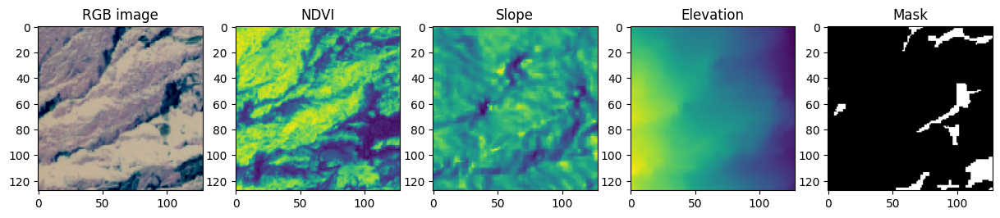

In [ ]:
img = 234
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(15, 10))

ax1.set_title("RGB image")
ax2.set_title("NDVI")
ax3.set_title("Slope")
ax4.set_title("Elevation")
ax5.set_title("Mask")

ax1.imshow(TRAIN_XX[img, :, :, 0:3])
ax2.imshow(TRAIN_XX[img, :, :, 3])
ax3.imshow(TRAIN_XX[img, :, :, 4])
ax4.imshow(TRAIN_XX[img, :, :, 5])
ax5.imshow(TRAIN_YY[img, :, :, 0], cmap='gray')
plt.show()

### train test split

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_temp, y_train, y_temp = train_test_split(TRAIN_XX, TRAIN_YY, test_size=0.3, shuffle=True)
x_validation, x_test, y_validation, y_test = train_test_split(x_temp, y_temp, test_size=0.5, shuffle=True)

In [ ]:
x_train.shape, y_train.shape

((2659, 128, 128, 6), (2659, 128, 128, 1))

In [ ]:
x_validation.shape, y_validation.shape

((570, 128, 128, 6), (570, 128, 128, 1))

In [ ]:
x_test.shape, y_test.shape

((570, 128, 128, 6), (570, 128, 128, 1))

In [ ]:
# to release some memory, delete the unnecessary variable
del TRAIN_XX
del TRAIN_YY
del all_train
del all_mask

In [ ]:
from tensorflow.keras import backend as K

# recall
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# precision
def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

#f1 score
def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [ ]:
from tensorflow.keras.losses import binary_crossentropy

def unet_model(IMG_WIDTH, IMG_HIGHT, IMG_CHANNELS):
    inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HIGHT, IMG_CHANNELS))

    # Converted inputs to floating
    #s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)


    #Contraction path
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = tf.keras.layers.Dropout(0.1)(c1)
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = tf.keras.layers.Dropout(0.1)(c2)
    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = tf.keras.layers.Dropout(0.2)(c3)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = tf.keras.layers.Dropout(0.2)(c4)
    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = tf.keras.layers.Dropout(0.3)(c5)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = tf.keras.layers.Dropout(0.2)(c6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = tf.keras.layers.Dropout(0.2)(c7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = tf.keras.layers.Dropout(0.1)(c8)
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = tf.keras.layers.Dropout(0.1)(c9)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss=binary_crossentropy, metrics=['accuracy', f1_m, precision_m, recall_m])

    return model

In [ ]:
unet = unet_model(128, 128, 6)
# unet.summary()
checkpointer = tf.keras.callbacks.ModelCheckpoint("best_unet.h5", monitor="val_f1_m", verbose=1, save_best_only=True, mode="max")
# earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_m', patience=10, verbose=1, mode='max')

callbacks = [
    # earlyStopping,
    checkpointer
    ]
history = unet.fit(x_train, y_train, batch_size=16,
          epochs=100,
          verbose = 2,
          validation_data=(x_validation, y_validation),
          callbacks=callbacks)

unet.save("unet_save.h5")

Epoch 1/100

Epoch 1: val_f1_m improved from -inf to 0.35010, saving model to best_unet.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


167/167 - 34s - loss: 0.1102 - accuracy: 0.9479 - f1_m: 0.0739 - precision_m: 0.4260 - recall_m: 0.0784 - val_loss: 0.0498 - val_accuracy: 0.9786 - val_f1_m: 0.3501 - val_precision_m: 0.7479 - val_recall_m: 0.2382 - 34s/epoch - 202ms/step
Epoch 2/100

Epoch 2: val_f1_m improved from 0.35010 to 0.49396, saving model to best_unet.h5
167/167 - 8s - loss: 0.0440 - accuracy: 0.9834 - f1_m: 0.5427 - precision_m: 0.7121 - recall_m: 0.4674 - val_loss: 0.0479 - val_accuracy: 0.9823 - val_f1_m: 0.4940 - val_precision_m: 0.8284 - val_recall_m: 0.3629 - 8s/epoch - 50ms/step
Epoch 3/100

Epoch 3: val_f1_m improved from 0.49396 to 0.63307, saving model to best_unet.h5
167/167 - 9s - loss: 0.0405 - accuracy: 0.9848 - f1_m: 0.5763 - precision_m: 0.7340 - recall_m: 0.5037 - val_loss: 0.0385 - val_accuracy: 0.9849 - val_f1_m: 0.6331 - val_precision_m: 0.7425 - val_recall_m: 0.5601 - 9s/epoch - 54ms/step
Epoch 4/100

Epoch 4: val_f1_m improved from 0.63307 to 0.65347, saving model to best_unet.h5
167/167

In [ ]:
loss, accuracy, f1_score, precision, recall = unet.evaluate(x_test, y_test, verbose=0)
print(loss, accuracy, f1_score, precision, recall)

0.03523101657629013 0.9874614477157593 0.7181284427642822 0.7798458933830261 0.6683467030525208


In [ ]:
loss, accuracy, f1_score, precision, recall = unet.evaluate(x_validation, y_validation, verbose=0)
print(loss, accuracy, f1_score, precision, recall)

0.03473658487200737 0.9873920679092407 0.7221114635467529 0.7786086201667786 0.6757392287254333


# Prediction

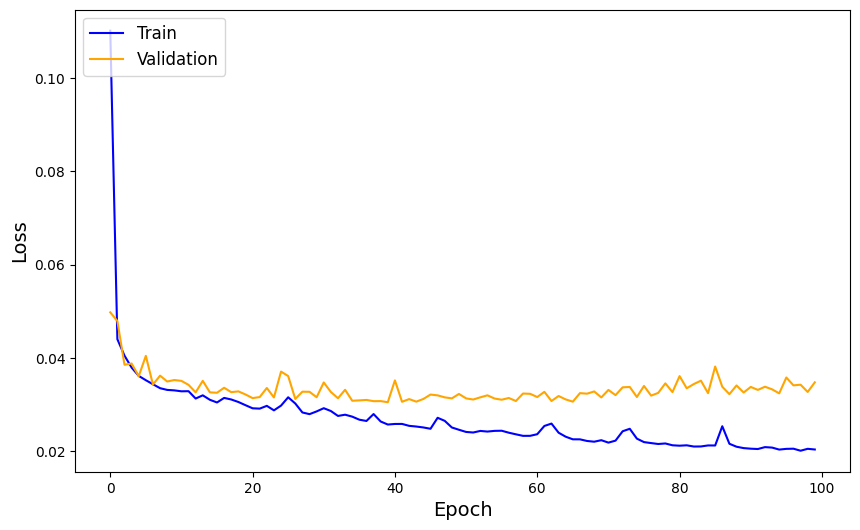

In [ ]:
# Create a figure and axis for the loss plot
plt.figure(figsize=(10, 6))  # Increased the figure size

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train', color='blue')
plt.plot(history.history['val_loss'], label='Validation', color='orange')

# Set labels and legend
plt.xlabel('Epoch', fontsize=14)  # Increased the font size
plt.ylabel('Loss', fontsize=14)   # Increased the font size
#plt.title('Training and Validation Loss Over Epochs', fontsize=16)  # Increased the font size
plt.legend(loc='upper left', fontsize=12)  # Increased the font size

# Display the plot
plt.show()


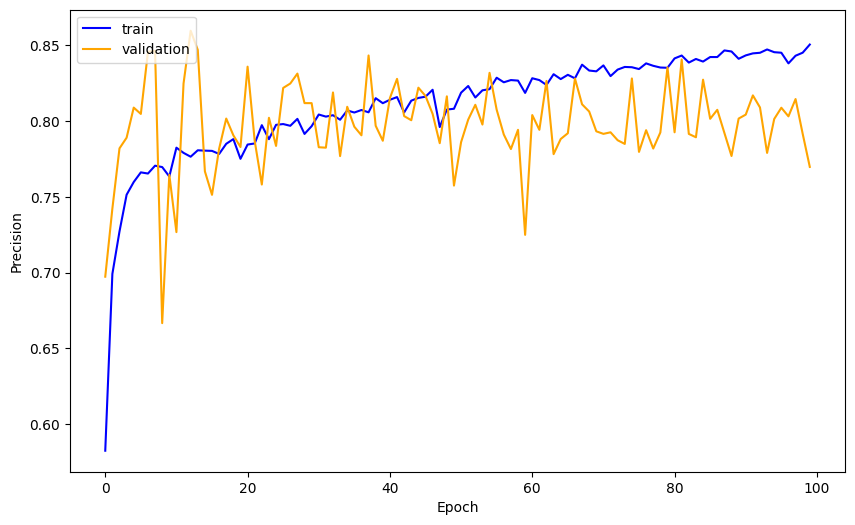

In [ ]:
# Create a figure and axis for the precision plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['precision_m'], label='train', color='blue')
plt.plot(history.history['val_precision_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend(loc='upper left')
plt.show()

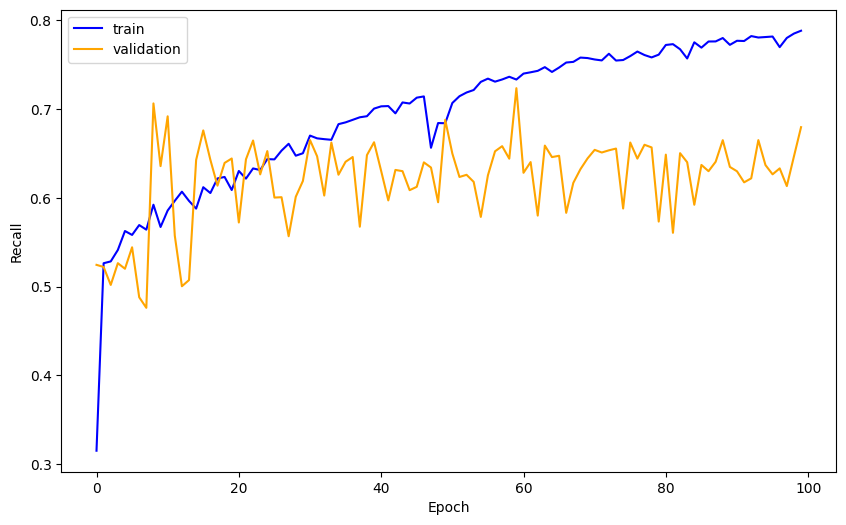

In [ ]:
# Create a figure and axis for the recall plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['recall_m'], label='train', color='blue')
plt.plot(history.history['val_recall_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend(loc='upper left')
plt.show()

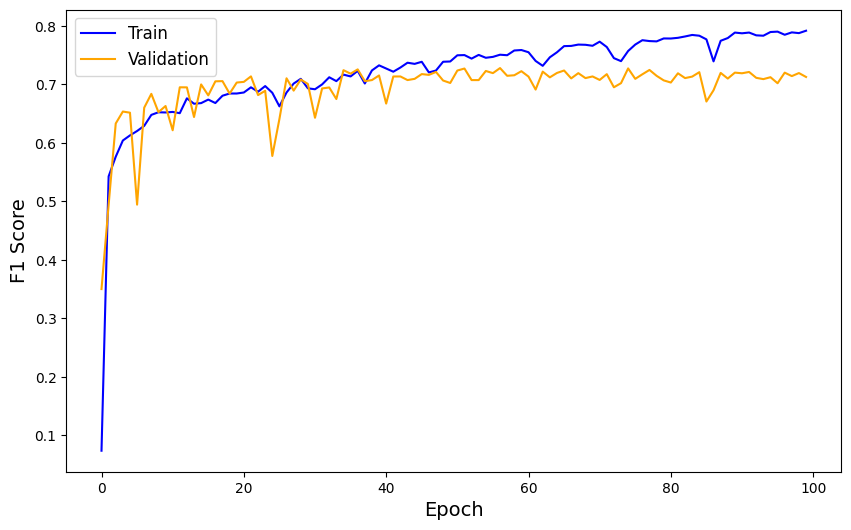

In [ ]:
# Create a figure and axis for the F1 score plot
plt.figure(figsize=(10, 6))  # Increased the figure size

# Plot training and validation F1 score
plt.plot(history.history['f1_m'], label='Train', color='blue')
plt.plot(history.history['val_f1_m'], label='Validation', color='orange')

# Set labels and legend
plt.xlabel('Epoch', fontsize=14)  # Increased the font size
plt.ylabel('F1 Score', fontsize=14)  # Increased the font size
#plt.title('Training and Validation F1 Score Over Epochs', fontsize=16)  # Increased the font size
plt.legend(loc='upper left', fontsize=12)  # Increased the font size

# Display the plot
plt.show()

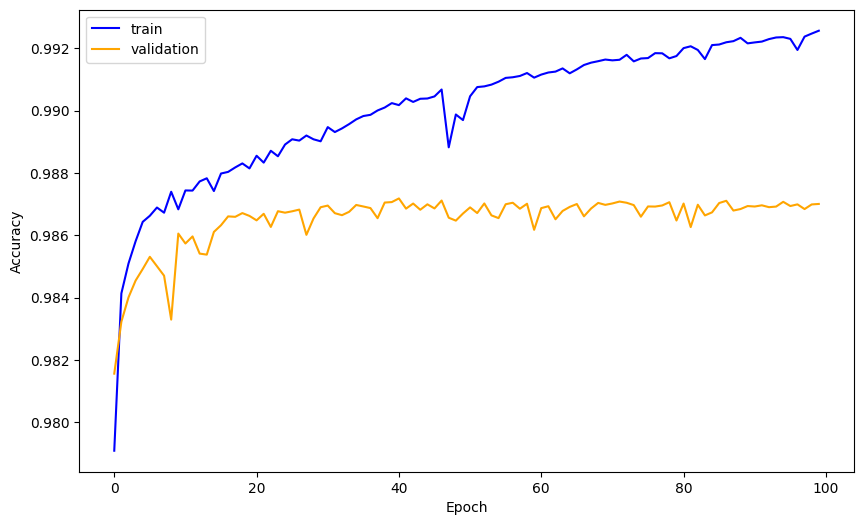

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis for the accuracy plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='train', color='blue')
plt.plot(history.history['val_accuracy'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Format the y-axis to show up to two decimal places
plt.gca().yaxis.set_major_formatter('{:.3f}'.format)

plt.show()

In [ ]:
threshold = 0.5
pred_img = unet.predict(x_test)
pred_img = (pred_img > threshold).astype(np.uint8)

18/18 [==============================] - 1s 24ms/step


In [ ]:
#releasing memory
del x_train
del y_train

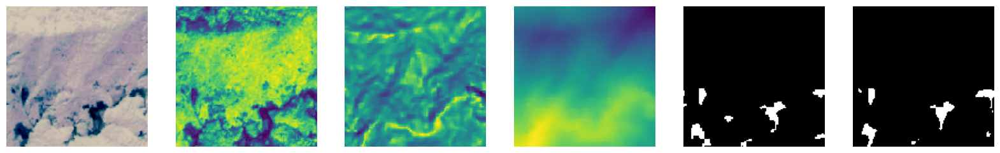

In [ ]:
import matplotlib.pyplot as plt

img = 255
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.axis('off')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.axis('off')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.axis('off')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.axis('off')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')
ax5.axis('off')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')
ax6.axis('off')

plt.show()

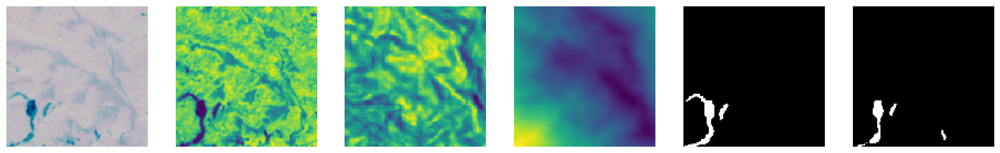

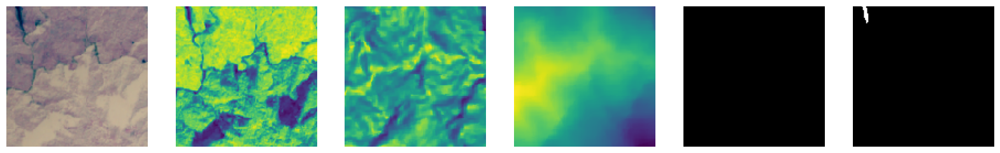

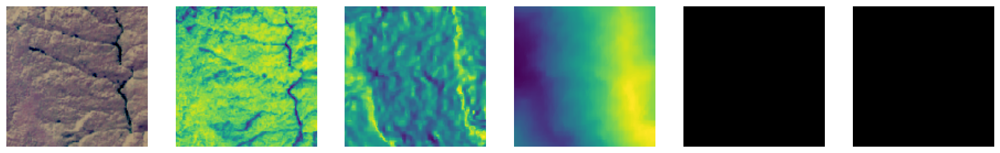

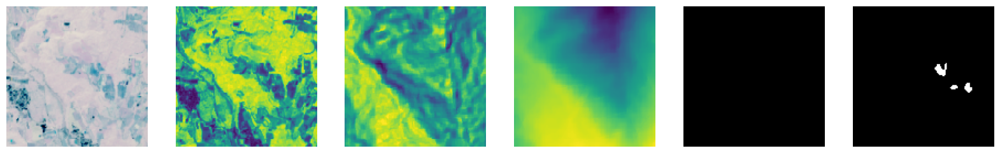

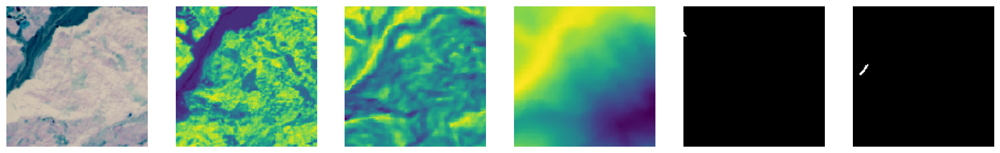

...

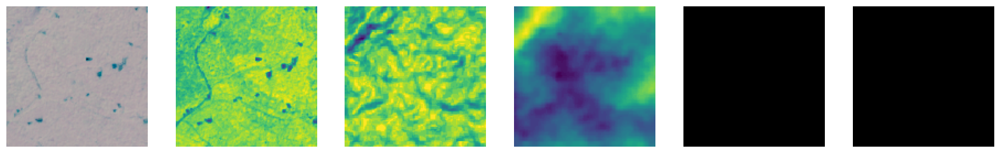

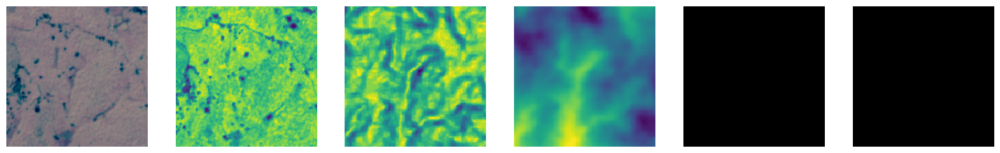

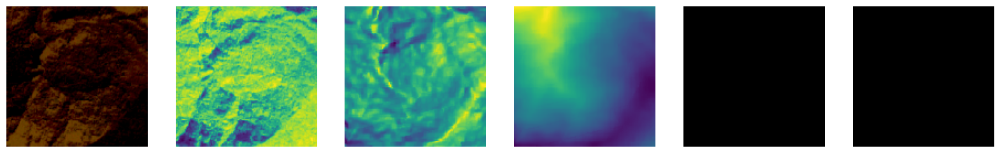

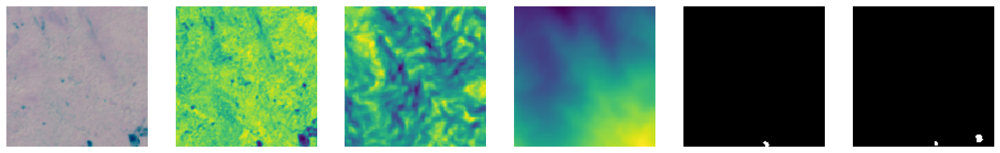

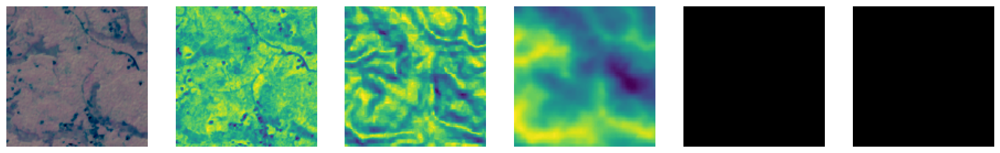

In [ ]:
import matplotlib.pyplot as plt

# Determine the number of test images
num_test_images = x_test.shape[0]

for i in range(num_test_images):
    fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

    # Display RGB image
    ax1.imshow(x_test[i, :, :, 0:3])
    ax1.axis('off')

    # Display NDVI
    ax2.imshow(x_test[i, :, :, 3])
    ax2.axis('off')

    # Display Slope
    ax3.imshow(x_test[i, :, :, 4])
    ax3.axis('off')

    # Display Elevation
    ax4.imshow(x_test[i, :, :, 5])
    ax4.axis('off')

    # Display Mask in black and white
    ax5.imshow(y_test[i, :, :, 0], cmap='gray')
    ax5.axis('off')

    # Display Prediction in black and white
    ax6.imshow(pred_img[i, :, :, 0], cmap='gray')
    ax6.axis('off')

    plt.show()

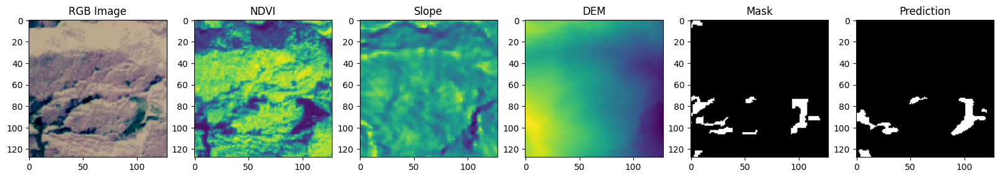

In [ ]:
import matplotlib.pyplot as plt

img = 255
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('DEM')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Mask
ax5.set_title('Mask')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Prediction
ax6.set_title('Prediction')

plt.show()

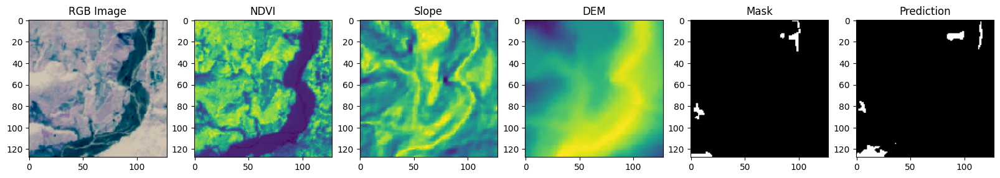

In [ ]:
import matplotlib.pyplot as plt

img = 33
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('DEM')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Mask
ax5.set_title('Mask')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Prediction
ax6.set_title('Prediction')

plt.show()

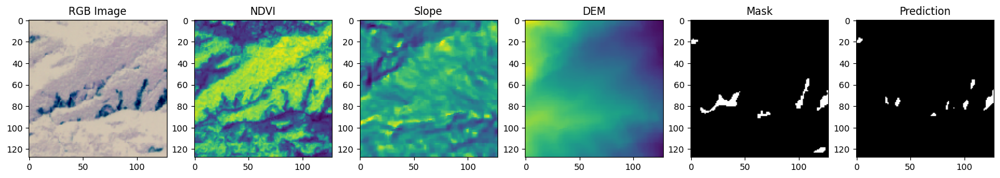

In [ ]:
import matplotlib.pyplot as plt

img = 210
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('DEM')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Mask
ax5.set_title('Mask')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Prediction
ax6.set_title('Prediction')

plt.show()

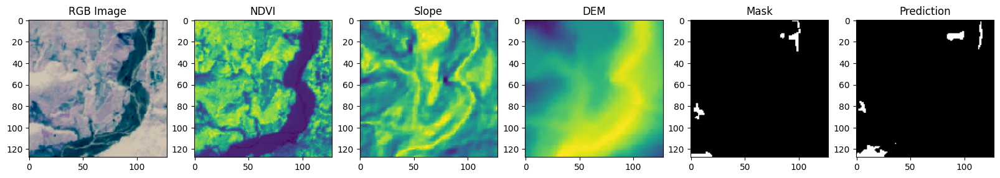

In [ ]:
import matplotlib.pyplot as plt

img = 33
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('DEM')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Mask
ax5.set_title('Mask')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Prediction
ax6.set_title('Prediction')

plt.show()

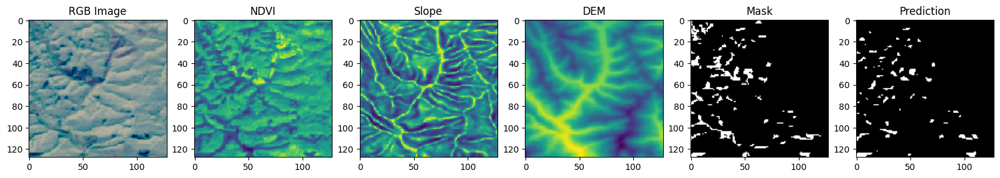

In [ ]:
import matplotlib.pyplot as plt

img = 56
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('DEM')

# Display Mask in black and white
ax5.imshow(y_test[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Mask
ax5.set_title('Mask')

# Display Prediction in black and white
ax6.imshow(pred_img[img, :, :, 0], cmap='gray')  # Using a grayscale colormap for Prediction
ax6.set_title('Prediction')

plt.show()

In [ ]:
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 6)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         880       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 128, 128, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 16)         2320      ['dropout[0][0]']             
                                                                                              

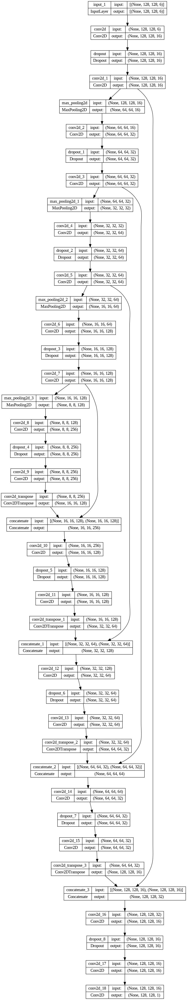

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Assuming 'unet' is your UNet model
plot_model(unet, show_shapes=True, to_file='unet_model_summary.png')

# 'show_shapes=True' displays the input and output shapes of each layer
# 'to_file' specifies the file name to save the model summary as an image

# FCN

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy

# Define the FCN model
def fcn_model(input_shape=(128, 128, 6)):
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Decoder
    up4 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv3)
    merge4 = concatenate([conv2, up4], axis=-1)
    conv4 = Conv2D(128, 3, activation='relu', padding='same')(merge4)

    up5 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv4)
    merge5 = concatenate([conv1, up5], axis=-1)
    conv5 = Conv2D(64, 3, activation='relu', padding='same')(merge5)

    # Output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(conv5)

    model = Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
fcn = fcn_model(input_shape=(128, 128, 6))
fcn.compile(optimizer=Adam(learning_rate=1e-4), loss=binary_crossentropy, metrics=['accuracy', f1_m, precision_m, recall_m])
# fcn.summary()
checkpointer = tf.keras.callbacks.ModelCheckpoint("best_fcn.h5", monitor="val_f1_m", verbose=1, save_best_only=True, mode="max")
# earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_m', patience=10, verbose=1, mode='max')

callbacks = [
    # earlyStopping,
    checkpointer
    ]
history = fcn.fit(x_train, y_train, batch_size=16,
          epochs=100,
          verbose = 2,
          validation_data=(x_validation, y_validation),
          callbacks=callbacks)

fcn.save("fcn_save.h5")

Epoch 1/100

Epoch 1: val_f1_m improved from -inf to 0.21545, saving model to best_fcn.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


167/167 - 37s - loss: 0.1221 - accuracy: 0.9763 - f1_m: 0.0174 - precision_m: 0.1585 - recall_m: 0.0104 - val_loss: 0.0630 - val_accuracy: 0.9771 - val_f1_m: 0.2154 - val_precision_m: 0.8103 - val_recall_m: 0.1296 - 37s/epoch - 219ms/step
Epoch 2/100

Epoch 2: val_f1_m improved from 0.21545 to 0.49065, saving model to best_fcn.h5
167/167 - 12s - loss: 0.0485 - accuracy: 0.9820 - f1_m: 0.5077 - precision_m: 0.7028 - recall_m: 0.4282 - val_loss: 0.0524 - val_accuracy: 0.9805 - val_f1_m: 0.4907 - val_precision_m: 0.7462 - val_recall_m: 0.3808 - 12s/epoch - 74ms/step
Epoch 3/100

Epoch 3: val_f1_m improved from 0.49065 to 0.61221, saving model to best_fcn.h5
167/167 - 12s - loss: 0.0441 - accuracy: 0.9836 - f1_m: 0.5808 - precision_m: 0.7047 - recall_m: 0.5205 - val_loss: 0.0468 - val_accuracy: 0.9813 - val_f1_m: 0.6122 - val_precision_m: 0.6528 - val_recall_m: 0.5988 - 12s/epoch - 74ms/step
Epoch 4/100

Epoch 4: val_f1_m improved from 0.61221 to 0.63073, saving model to best_fcn.h5
167/16

In [ ]:
#releasing memory
del x_train
del y_train

In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score

predicted_values = fcn.predict(x_validation)

predicted_values_flat = predicted_values.flatten()
y_validation_flat = y_validation.flatten()

threshold = 0.5
predicted_binary = (predicted_values_flat > threshold).astype(int)

f1 = f1_score(y_validation_flat, predicted_binary)
precision = precision_score(y_validation_flat, predicted_binary)
recall = recall_score(y_validation_flat, predicted_binary)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

18/18 [==============================] - 3s 111ms/step
F1 Score: 0.7061834093937865
Precision: 0.7500865168323304
Recall: 0.6671354859119104


In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score

predicted_values = fcn.predict(x_test)

predicted_values_flat = predicted_values.flatten()
y_test_flat = y_test.flatten()

threshold = 0.5
predicted_binary = (predicted_values_flat > threshold).astype(int)

f1 = f1_score(y_test_flat, predicted_binary)
precision = precision_score(y_test_flat, predicted_binary)
recall = recall_score(y_test_flat, predicted_binary)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

18/18 [==============================] - 1s 47ms/step
F1 Score: 0.6824979757302118
Precision: 0.7081133408626857
Recall: 0.6586711379526271


# Prediction

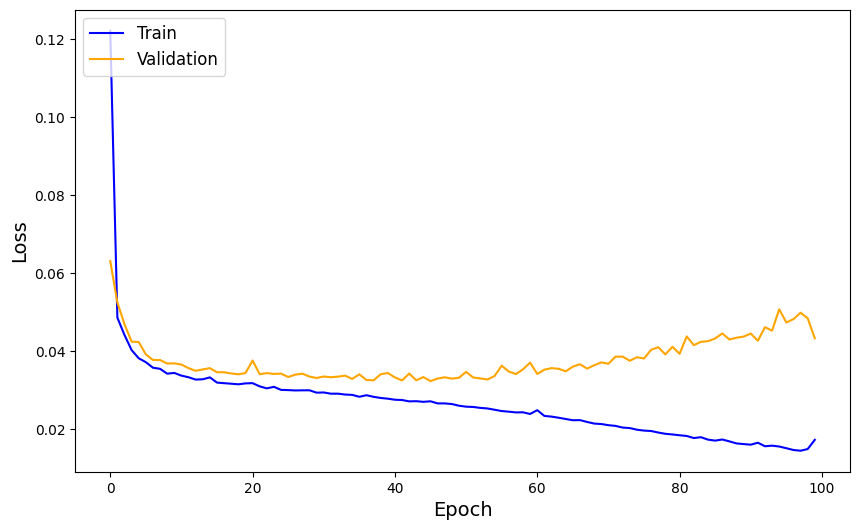

In [ ]:
# Create a figure and axis for the loss plot
plt.figure(figsize=(10, 6))  # Increased the figure size

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train', color='blue')
plt.plot(history.history['val_loss'], label='Validation', color='orange')

# Set labels and legend
plt.xlabel('Epoch', fontsize=14)  # Increased the font size
plt.ylabel('Loss', fontsize=14)   # Increased the font size
#plt.title('Training and Validation Loss Over Epochs', fontsize=16)  # Increased the font size
plt.legend(loc='upper left', fontsize=12)  # Increased the font size

# Display the plot
plt.show()


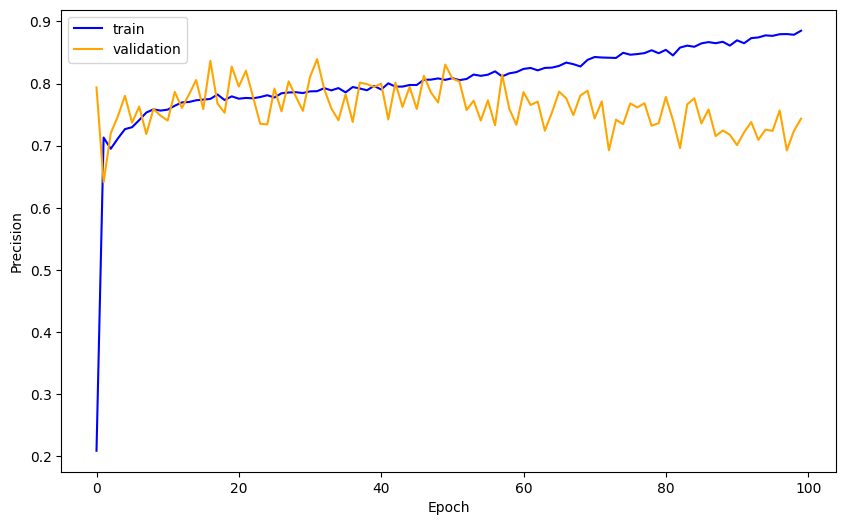

In [ ]:
# Create a figure and axis for the precision plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['precision_m'], label='train', color='blue')
plt.plot(history.history['val_precision_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend(loc='upper left')
plt.show()

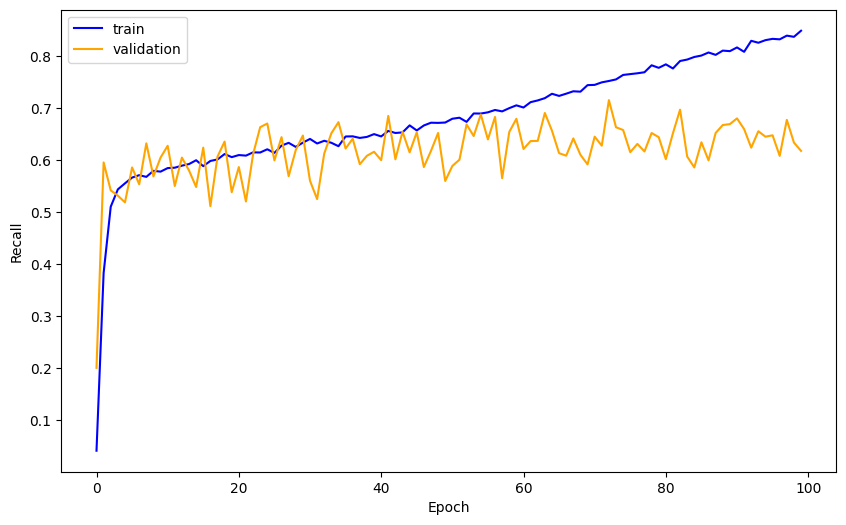

In [ ]:
# Create a figure and axis for the recall plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['recall_m'], label='train', color='blue')
plt.plot(history.history['val_recall_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend(loc='upper left')
plt.show()

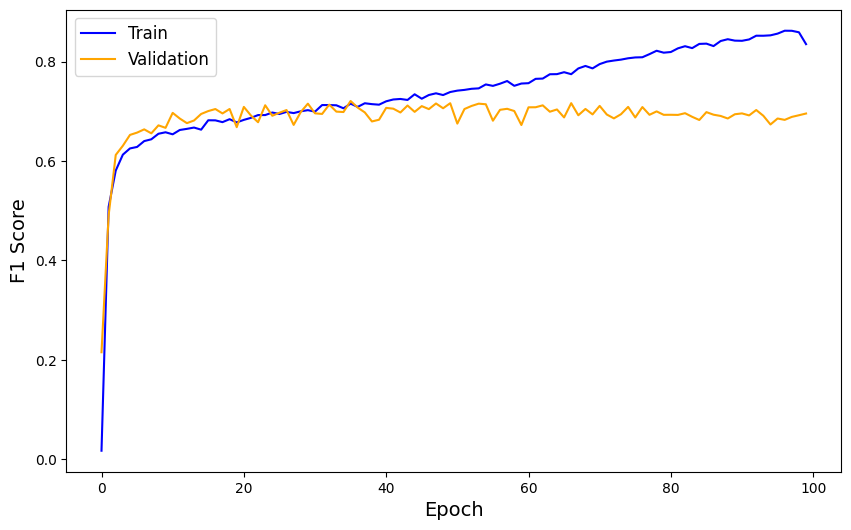

In [ ]:
# Create a figure and axis for the F1 score plot
plt.figure(figsize=(10, 6))  # Increased the figure size

# Plot training and validation F1 score
plt.plot(history.history['f1_m'], label='Train', color='blue')
plt.plot(history.history['val_f1_m'], label='Validation', color='orange')

# Set labels and legend
plt.xlabel('Epoch', fontsize=14)  # Increased the font size
plt.ylabel('F1 Score', fontsize=14)  # Increased the font size
#plt.title('Training and Validation F1 Score Over Epochs', fontsize=16)  # Increased the font size
plt.legend(loc='upper left', fontsize=12)  # Increased the font size

# Display the plot
plt.show()

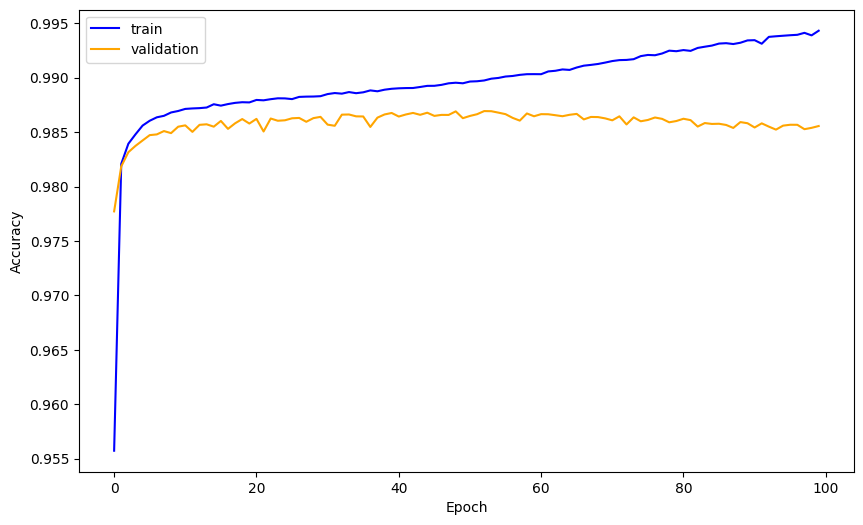

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis for the accuracy plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='train', color='blue')
plt.plot(history.history['val_accuracy'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Format the y-axis to show up to two decimal places
plt.gca().yaxis.set_major_formatter('{:.3f}'.format)

plt.show()

In [ ]:
threshold = 0.5
pred_img = fcn.predict(x_test)
pred_img = (pred_img > threshold).astype(np.uint8)

18/18 [==============================] - 1s 51ms/step


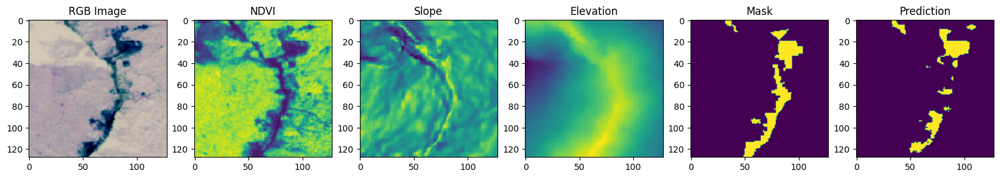

In [ ]:
img = 200
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

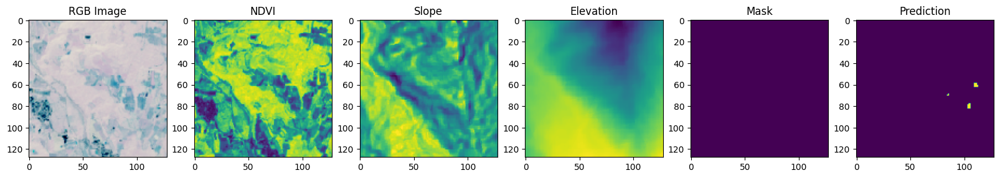

In [ ]:
img = 33
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

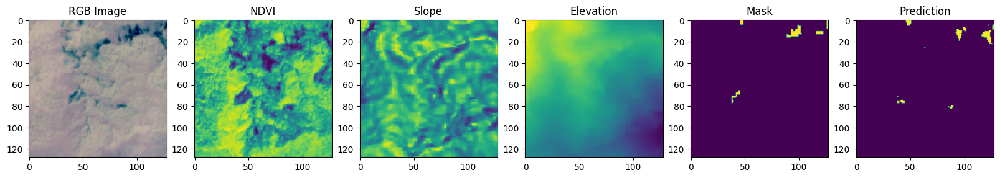

In [ ]:
img = 210
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

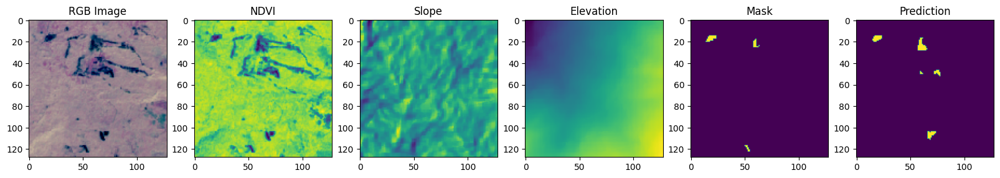

In [ ]:
img = 10
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

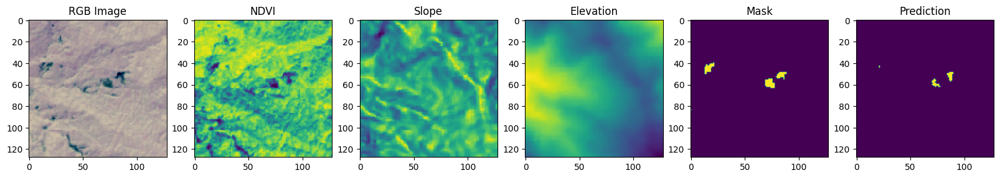

In [ ]:
img = 223
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
fcn.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 6)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         3520      ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 64, 64, 64)           0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 64, 64, 128)          73856     ['max_pooling2d[0][0]']   

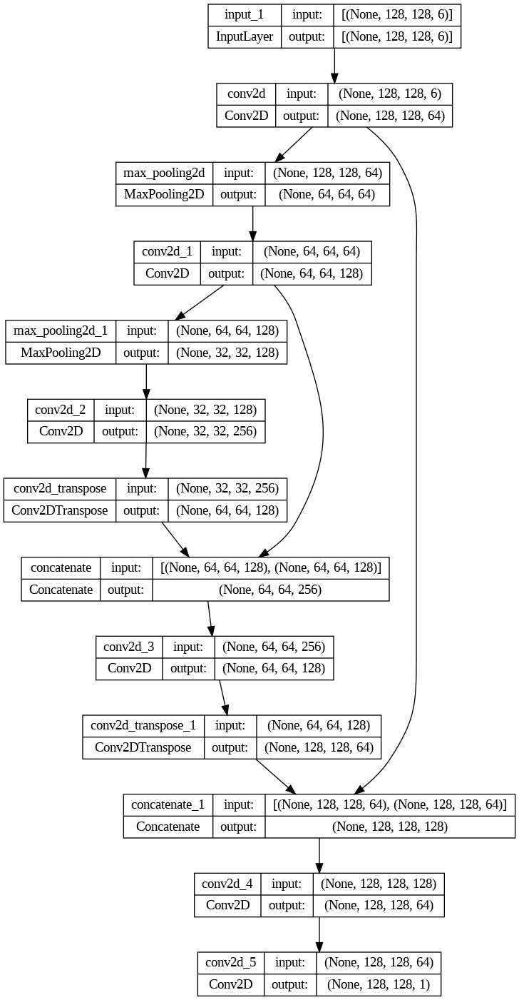

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

plot_model(fcn, show_shapes=True, to_file='fcn_model_summary.png')

# 'show_shapes=True' displays the input and output shapes of each layer
# 'to_file' specifies the file name to save the model summary as an image

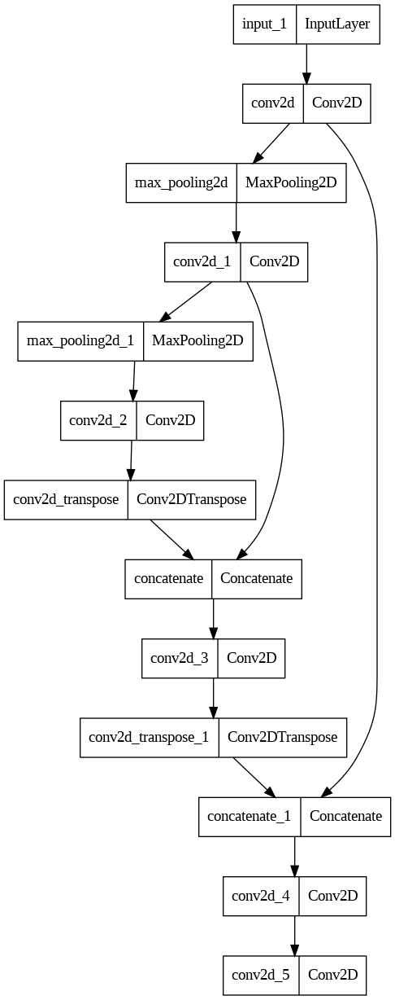

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

plot_model(fcn, show_shapes=False, to_file='fcnmodel_summary.png')

# MACUNet

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, GlobalAveragePooling2D, GlobalMaxPooling2D, ReLU, BatchNormalization, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.activations import sigmoid
from sklearn.model_selection import train_test_split

class ChannelAttention(tf.keras.layers.Layer):
    def __init__(self, in_planes, out_planes, ratio=2):
        super(ChannelAttention, self).__init__()
        self.conv = Conv2D(out_planes, kernel_size=1, use_bias=False)
        self.avg_pool = GlobalAveragePooling2D()
        self.max_pool = GlobalMaxPooling2D()

        self.fc11 = Conv2D(out_planes // ratio, kernel_size=1, use_bias=False)
        self.fc12 = Conv2D(out_planes, kernel_size=1, use_bias=False)

        self.fc21 = Conv2D(out_planes // ratio, kernel_size=1, use_bias=False)
        self.fc22 = Conv2D(out_planes, kernel_size=1, use_bias=False)
        self.relu1 = ReLU()

        self.sigmoid = Sigmoid()

    def call(self, x):
        x = self.conv(x)
        avg_out = self.fc12(self.relu1(self.fc11(self.avg_pool(x))))
        max_out = self.fc22(self.relu1(self.fc21(self.max_pool(x))))
        out = avg_out + max_out
        return x * self.sigmoid(out)

class ACBlock(tf.keras.layers.Layer):
    def __init__(self, in_planes, out_planes):
        super(ACBlock, self).__init__()
        self.squre = Conv2D(out_planes, kernel_size=3, padding='same', activation='relu')
        self.cross_ver = Conv2D(out_planes, kernel_size=(1, 3), padding='same', activation='relu')
        self.cross_hor = Conv2D(out_planes, kernel_size=(3, 1), padding='same', activation='relu')
        self.bn = BatchNormalization()

    def call(self, x):
        x1 = self.squre(x)
        x2 = self.cross_ver(x)
        x3 = self.cross_hor(x)
        return self.bn(x1 + x2 + x3)

def create_macunet(input_shape=(128, 128, 6), num_classes=1):
    inputs = Input(shape=input_shape)
    x = ACBlock()(inputs)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = ACBlock()(x)
    x = ACBlock()(x)

    # Apply Channel Attention
    x = ChannelAttention()(x)

    # Upsampling
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)
    x = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same', activation='relu')(x)
    x = ACBlock()(x)

    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(x)

    model = Model(inputs, outputs)
    return model

In [ ]:
macunet = MACUNet(band_num=6, class_num=2)
macunet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy', f1_m, precision_m, recall_m])

checkpointer = tf.keras.callbacks.ModelCheckpoint("best_macunet.h5", monitor="val_f1_m", verbose=1, save_best_only=True, mode="max")

callbacks = [checkpointer]

history = macunet.fit(x_train, y_train, batch_size=16,
                      epochs=100,
                      verbose=2,
                      validation_data=(x_validation, y_validation),
                      callbacks=callbacks)

macunet.save("macunet_save.h5")

NameError: ignored

# Unet Model

In [ ]:
from tensorflow.keras.losses import binary_crossentropy

def unet_model(IMG_WIDTH, IMG_HIGHT, IMG_CHANNELS):
    inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HIGHT, IMG_CHANNELS))

    # Converted inputs to floating
    #s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)


    #Contraction path
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = tf.keras.layers.Dropout(0.1)(c1)
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = tf.keras.layers.Dropout(0.1)(c2)
    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = tf.keras.layers.Dropout(0.2)(c3)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = tf.keras.layers.Dropout(0.2)(c4)
    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = tf.keras.layers.Dropout(0.3)(c5)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = tf.keras.layers.Dropout(0.2)(c6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = tf.keras.layers.Dropout(0.2)(c7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = tf.keras.layers.Dropout(0.1)(c8)
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = tf.keras.layers.Dropout(0.1)(c9)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', dice_loss, metrics=['accuracy', f1_m, precision_m, recall_m])

    return model

SyntaxError: ignored

In [ ]:
unet = unet_model(128, 128, 6)
# unet.summary()
checkpointer = tf.keras.callbacks.ModelCheckpoint("best_unet.h5", monitor="val_f1_m", verbose=1, save_best_only=True, mode="max")
# earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_m', patience=10, verbose=1, mode='max')

callbacks = [
    # earlyStopping,
    checkpointer
    ]
history = unet.fit(x_train, y_train, batch_size=16,
          epochs=60,
          verbose = 2,
          validation_data=(x_validation, y_validation),
          callbacks=callbacks)

unet.save("unet_save.h5")

In [ ]:
loss, accuracy, f1_score, precision, recall = unet.evaluate(x_test, y_test, verbose=0)
print(loss, accuracy, f1_score, precision, recall)

In [ ]:
loss, accuracy, f1_score, precision, recall = unet.evaluate(x_validation, y_validation, verbose=0)
print(loss, accuracy, f1_score, precision, recall)

# Prediction

In [ ]:
# Create a figure and axis for the loss plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='train', color='blue')
plt.plot(history.history['val_loss'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

In [ ]:
# Create a figure and axis for the precision plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['precision_m'], label='train', color='blue')
plt.plot(history.history['val_precision_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend(loc='upper left')
plt.show()

In [ ]:
# Create a figure and axis for the recall plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['recall_m'], label='train', color='blue')
plt.plot(history.history['val_recall_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend(loc='upper left')
plt.show()

In [ ]:
# Create a figure and axis for the F1 score plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['f1_m'], label='train', color='blue')
plt.plot(history.history['val_f1_m'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend(loc='upper left')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis for the accuracy plot
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='train', color='blue')
plt.plot(history.history['val_accuracy'], label='validation', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

# Format the y-axis to show up to two decimal places
plt.gca().yaxis.set_major_formatter('{:.3f}'.format)

plt.show()

In [ ]:
threshold = 0.5
pred_img = unet.predict(x_test)
pred_img = (pred_img > threshold).astype(np.uint8)

In [ ]:
img = 200
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
img = 33
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
img = 210
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
img = 10
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
img = 222
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(20, 10))

# Display RGB image
ax1.imshow(x_test[img, :, :, 0:3])
ax1.set_title('RGB Image')

# Display NDVI
ax2.imshow(x_test[img, :, :, 3])
ax2.set_title('NDVI')

# Display Slope
ax3.imshow(x_test[img, :, :, 4])
ax3.set_title('Slope')

# Display Elevation
ax4.imshow(x_test[img, :, :, 5])
ax4.set_title('Elevation')

# Display Mask
ax5.imshow(y_test[img, :, :, 0])
ax5.set_title('Mask')

# Display Prediction
ax6.imshow(pred_img[img, :, :, 0])
ax6.set_title('Prediction')

plt.show()

In [ ]:
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 6)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         880       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 128, 128, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 16)         2320      ['dropout[0][0]']             
                                                                                              

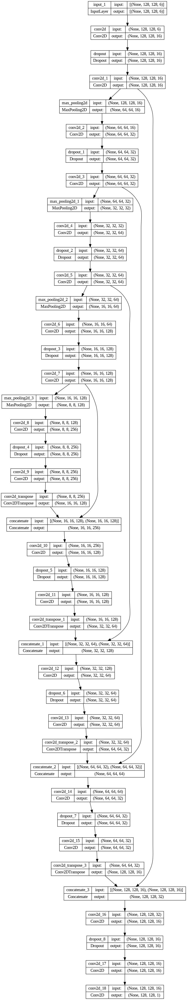

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Assuming 'unet' is your UNet model
plot_model(unet, show_shapes=True, to_file='unet_model_summary.png')

# 'show_shapes=True' displays the input and output shapes of each layer
# 'to_file' specifies the file name to save the model summary as an image